In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
import os
os.chdir('/content/drive/MyDrive/Yolo_training')

In [3]:
ls

yolo_training.ipynb  yolov5/


In [5]:
#!git clone https://github.com/ultralytics/yolov5.git

In [4]:
os.chdir('yolov5')

In [5]:
ls

benchmarks.py    data_images/  infer_img/      README.md         train.py
CITATION.cff     data.yaml     LICENSE         README.zh-CN.md   tutorial.ipynb
classify/        detect.py     models/         requirements.txt  utils/
CONTRIBUTING.md  export.py     __pycache__/    runs/             val.py
data/            hubconf.py    pyproject.toml  segment/          yolov5s.pt


In [7]:
!pip install -r requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.2/881.2 kB 16.9 MB/s eta 0:00:00


## Training YOLO v5 model

In [8]:
!python train.py --data data.yaml --cfg yolov5s.yaml --batch-size 8 --name Model --epochs 25

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-11-11 09:56:25.535234: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-11 09:56:25.554648: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-11 09:56:25.560532: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to regi

In [9]:
!python export.py --weights runs/train/Model/weights/best.pt --include onnx --simplify --opset 12

export: data=data/coco128.yaml, weights=['runs/train/Model/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, per_tensor=False, dynamic=False, cache=, simplify=True, mlmodel=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['onnx']
YOLOv5 🚀 v7.0-383-g1435a8ee Python-3.10.12 torch-2.4.1+cu121 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from runs/train/Model/weights/best.pt with output shape (1, 25200, 8) (13.7 MB)

ONNX: starting export with onnx 1.17.0...
ONNX: slimming with onnxslim 0.1.37...
ONNX: export success ✅ 1.2s, saved as runs/train/Model/weights/best.onnx (27.2 MB)

Export complete (1.6s)
Results saved to /content/drive/MyDrive/Yolo_training/yolov5/runs/train/Model/weights
Detect:          python detect.py --weights runs/train

In [7]:
!python val.py --weights /content/drive/MyDrive/Yolo_training/yolov5/runs/train/Model/weights/best.pt --data data.yaml --img 640 --half

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.8/883.8 kB 44.7 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
val: data=data.yaml, weights=['/content/drive/MyDrive/Yolo_training/yolov5/runs/train/Model/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-383-g1435a8ee Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
100% 755k/755k [00:00<00:00, 10

In [4]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/Yolo_training/yolov5/runs/train/Model


<IPython.core.display.Javascript object>

In [28]:
!python detect.py --weights /content/drive/MyDrive/Yolo_training/yolov5/runs/train/Model/weights/best.pt --img 640 --conf 0.25 --source /content/drive/MyDrive/Yolo_training/yolov5/infer_img


detect: weights=['/content/drive/MyDrive/Yolo_training/yolov5/runs/train/Model/weights/best.pt'], source=/content/drive/MyDrive/Yolo_training/yolov5/infer_img, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-383-g1435a8ee Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/20 /content/drive/MyDrive/Yolo_training/yolov5/infer_img/Car125.jpg: 640x480 1 number_plate, 1 logo, 2 signal_lightss, 29.0ms
image 2/20 /content/drive/MyDrive/Yolo_training/yolov5/i

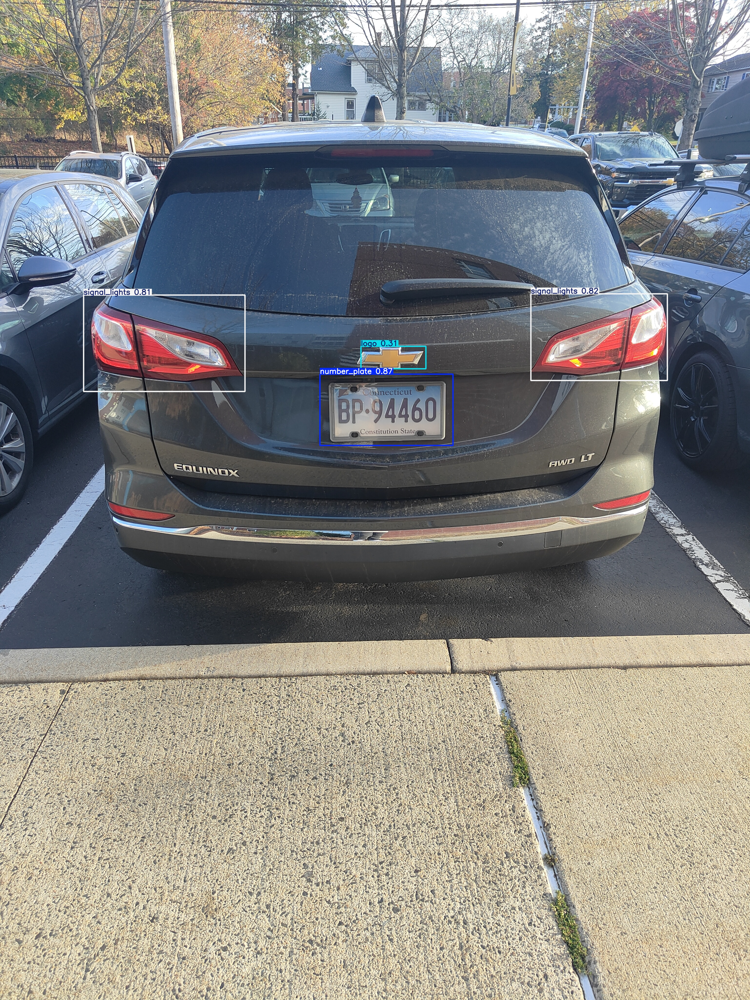

In [ ]:
import os
from IPython.display import Image, display

# Path to the directory where the output images are saved
output_dir = '/content/drive/MyDrive/Yolo_training/yolov5/runs/detect/exp2'

# Get all image files in the output directory
output_images = [f for f in os.listdir(output_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

# Display each image
for img_file in output_images:
    display(Image(filename=os.path.join(output_dir, img_file)))
